Pictures are taken from here https://github.com/Dyakonov/DL/blob/master/2020/DL2020_053gan_13n.pdf

# Main idea of GAN

- generator generates image and discriminator (using real world images) tries to find out if this image is fake or real
- if discriminator can't find this out - then generator is good enough (or discriminator isn't good enough)
- in ract discriminator is differentiable loss function
- unlike PixelCNN and VAE, GAN doesn't have explicit density function
- game approach

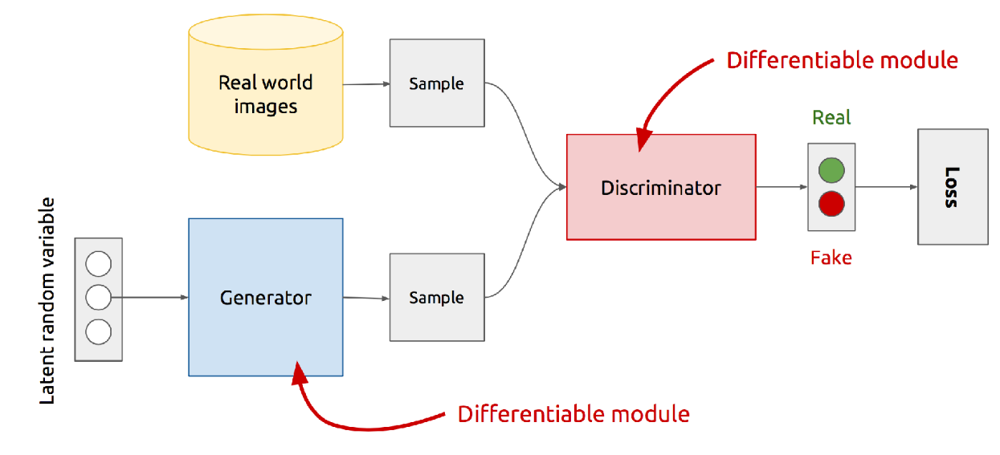

# GAN training

- freeze generator and generate images
- train discriminator to distinguish real images and generated
- then freeze discriminator and train generator to generate more realistic images

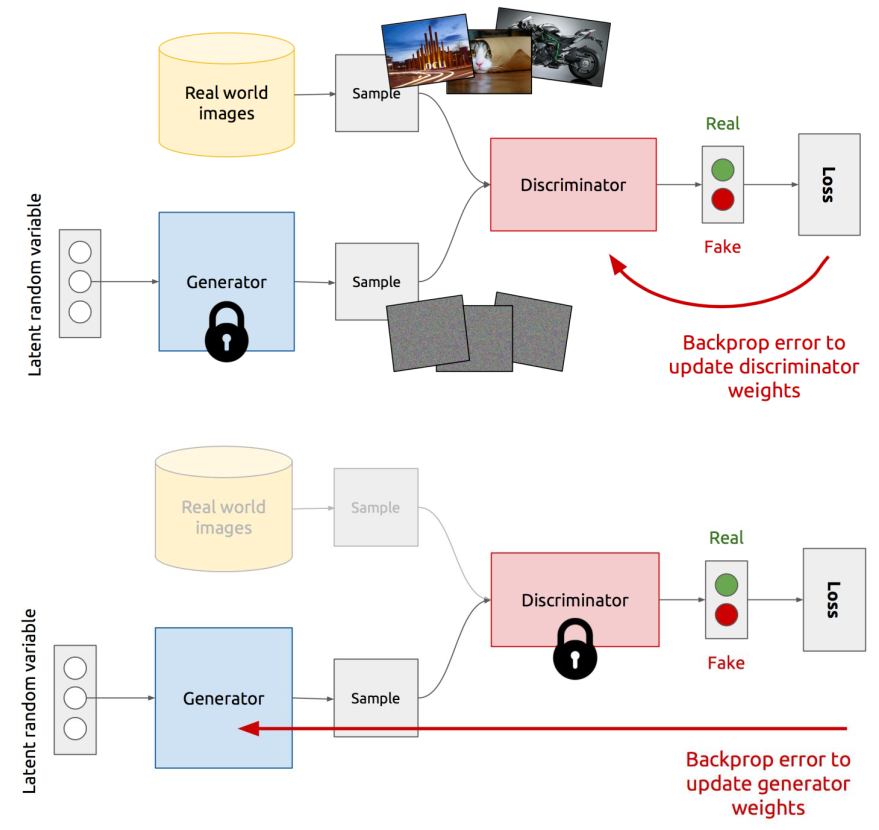

## GAN training process

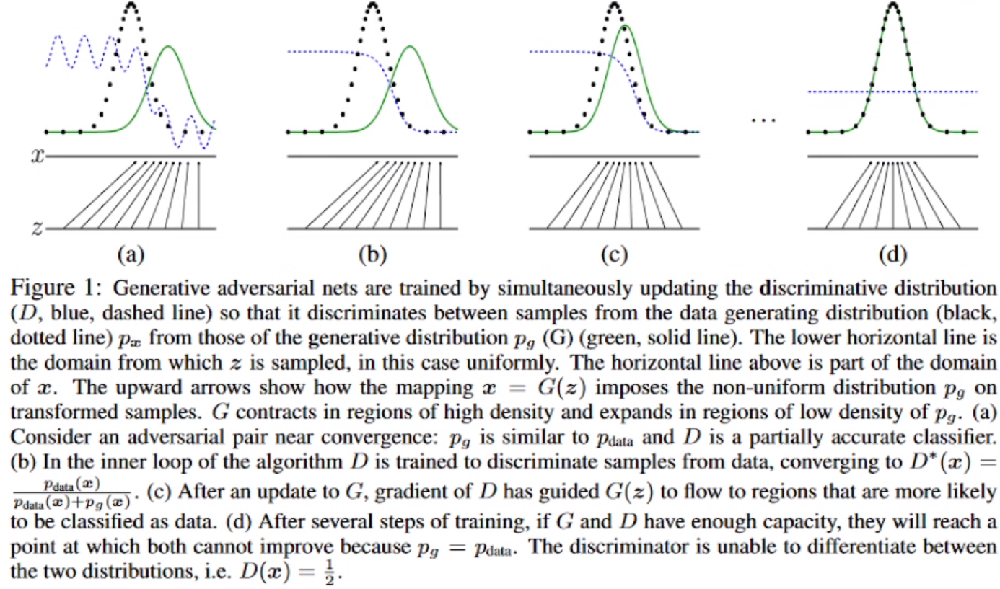

# GAN training: math

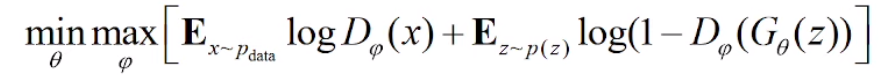

- training - **MIN-MAX game**
- discriminator returns likelihood from [0, 1]
- D<sub>φ</sub>(x) - likelihood for real data
- D<sub>φ</sub>(G<sub>θ</sub>(z)) - likelihood for generated data  
- discriminator wants D<sub>φ</sub>(x) -> 1, D<sub>φ</sub>(G<sub>θ</sub>(z)) -> 0
- generator wants D<sub>φ</sub>(G<sub>θ</sub>(z)) -> 1
- discriminator - standard classifier (cross entropy loss)
- generator - depends on objects that are generated

## What if we freeze generator?

We will get this formula:

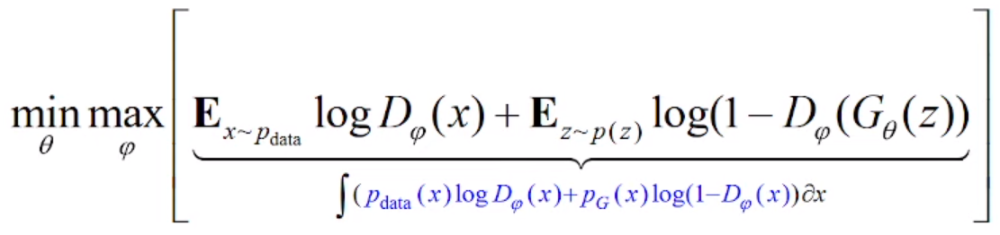

If we take derivative for D and equate it to zero, we will get optimal discriminator with fixed generator

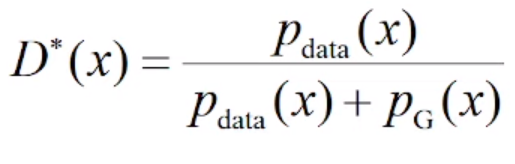

Where p<sub>G</sub> - distribution of fakes:

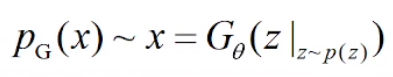

If we put this optimal generator back to formula, we will get sum of KL divergences:

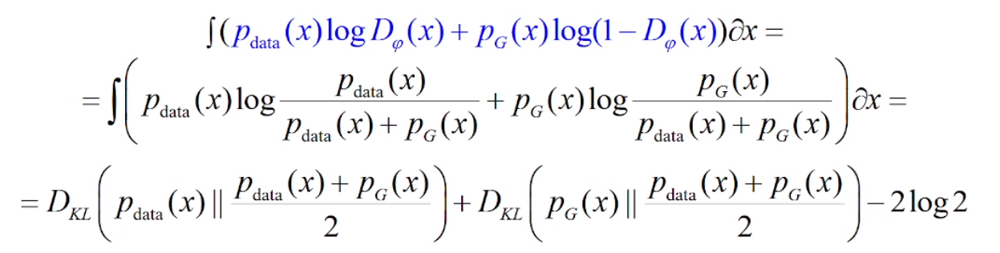

Result is Jensen-Shannon Divergence (JSD)

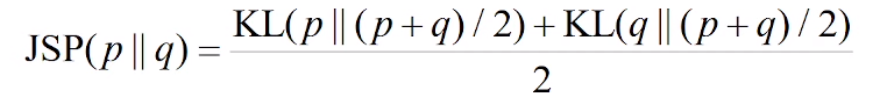

# Algorithm of GAN training

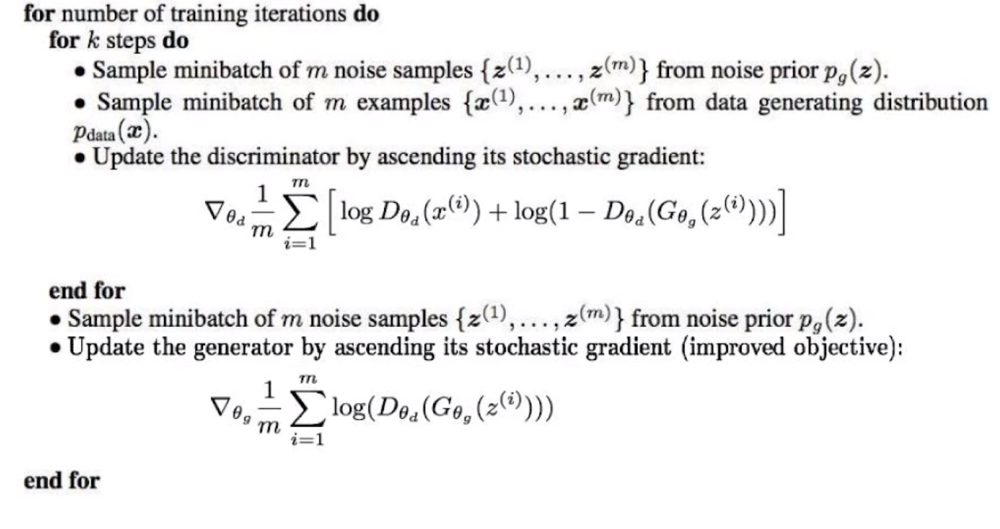

# GAN training: problems

 - when sample is likely fake, discriminator gradient in this region is relatively small, but we need big gradient to improve generator

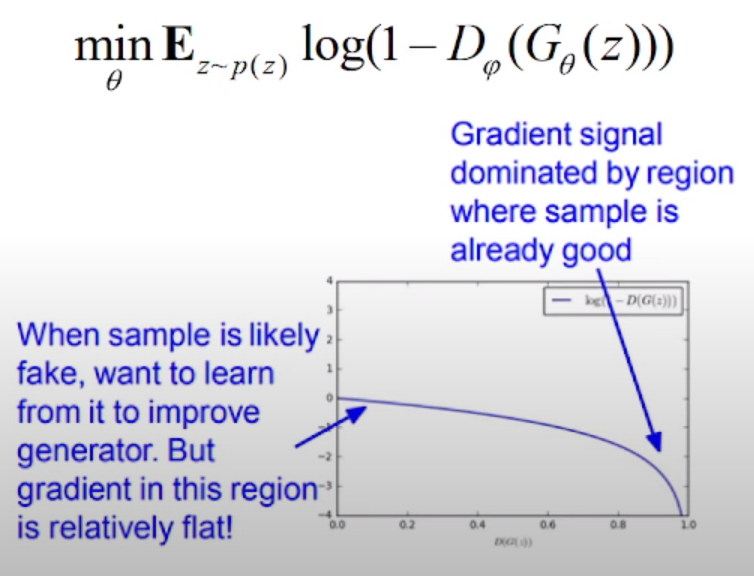

This can be fixed by maximization of likelihood of discriminator mistake instead of minimzing likelihood of discriminator correctness.

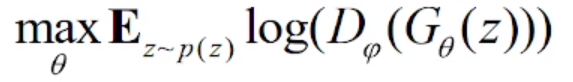

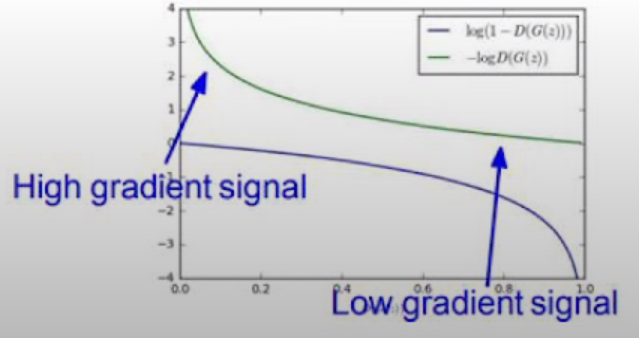

- loss over time can significantly increase

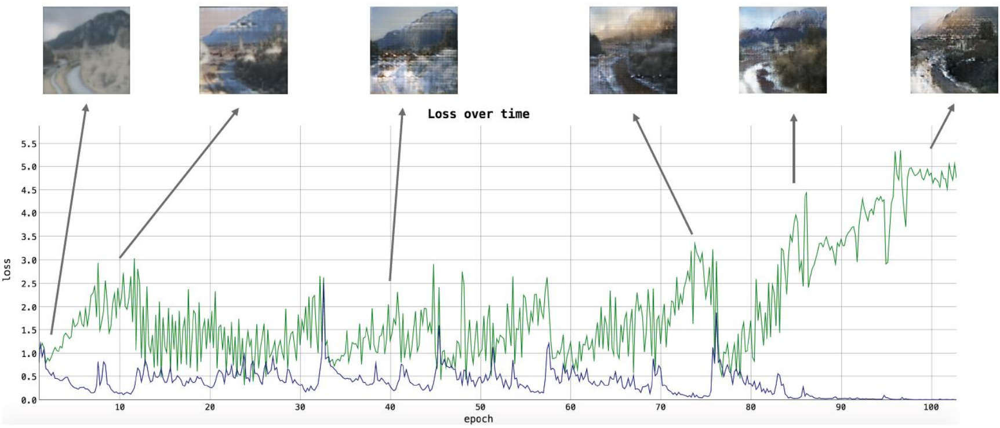

- discriminator trains better than generator

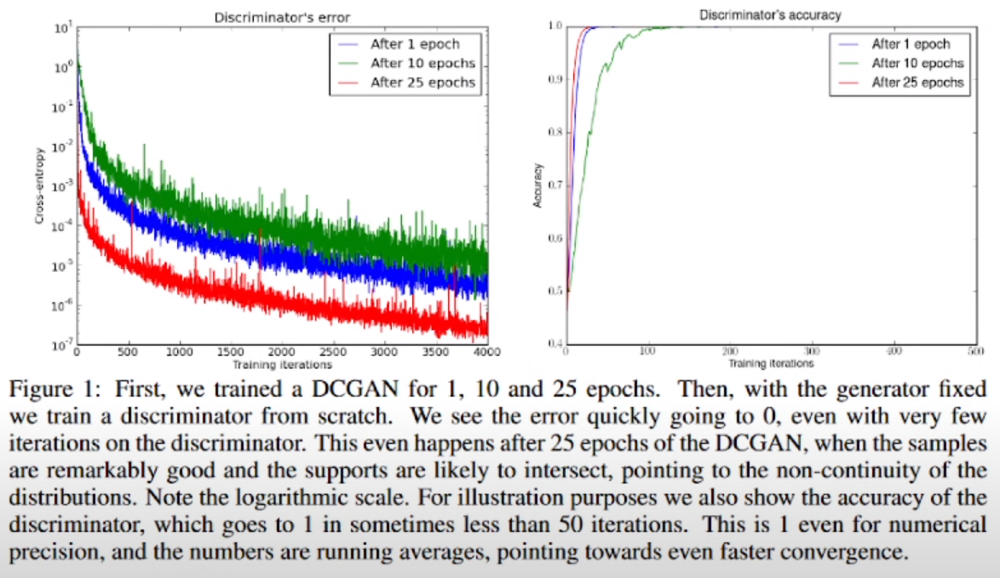

- gradient becomes unstable fpr later epochs

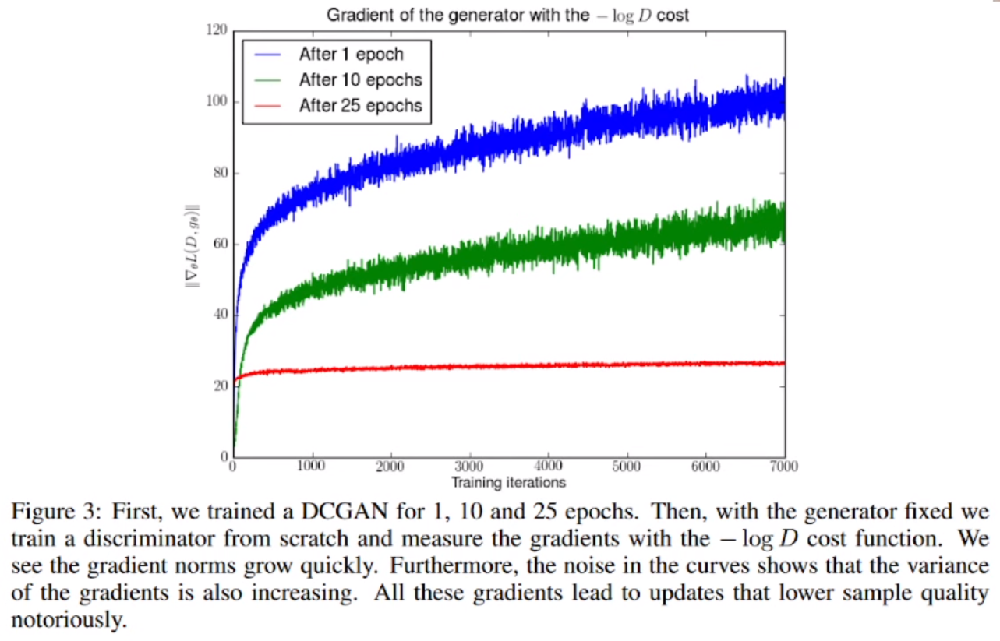

- min-max tasks require some balance between both sides while SGD looks for global minimum, this leads to unstable training process

- discriminative task is not convex -> training can end up in local minimum

- Mode Collapse: generators learns to generate only a specific image (like image of only one cats or images of cats only) and doesn't generate different images

# Tricks for GAN training

- input normalization (image -> [-1, +1], output - tanh)
- max(log(D(G))) instead of min(log(1-D(G))) - from programming point of view we just replace real and fake labels with each other
- z is better to sample from Gaussian distribution instead of Uniform distribution
- mini-batches must be clean (all real or all fake) - solves problem of Mode Collapse (if all fake images are almost the same, discriminator would see it and return fake, so generator would have to learn to generate diverse images)
- Virtual Batch Normalization (VBN): generate mini-batch at the begining on training, and for each new object add this object to mini-batch and make normalization; statisctics is calculated better + this helps to handle with Mode Collapse
- don't use Sparse Gradients (ReLU, Pool), use LeakyReLU instead, Avg Pool + Conv2d + stride for Downsampling, PixelShuffle + ConvTranspose2d + stride for Upsampling
- label smoothing: 0 -> [0, 0.3], 1 -> [0.7, 1.2]
- use DCGAN (or hybrid KL + GAN or VAE + GAN)
- use tricks from RL (like Experience Replay)
- Adam for generator, SGD for discriminator
- add noise to input / generator layers / labels
- add discrete variables to condition GAN (use Embedding layer with low embedding dimensionality, add it as new channel of image)
- use dropout in generator
- regularization of gradient norm (special term to make corrected parameters does not significantly differ from average of all corrections) ?
- new loss-functions
- feature matching (control not only similarity of image and output but also control similarity of features in hidden layers of discriminator)
- make discriminator to detect not only fake/not fake but also a class

# GAN types

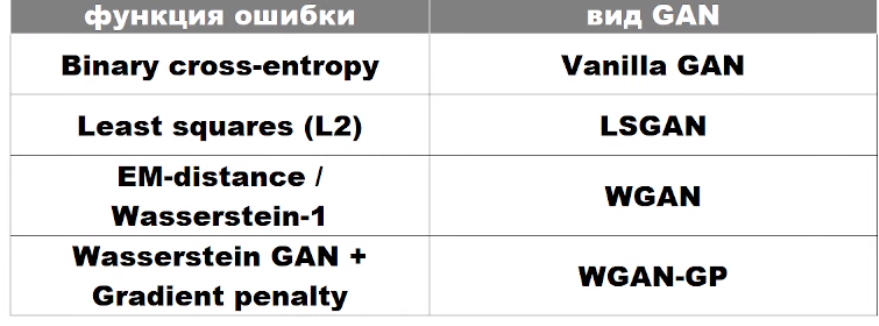

# LSGAN

Main idea: L2 loss instead of cross-entropy

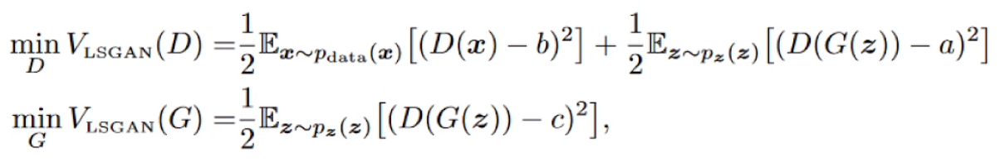

# Wasserstein GAN (WGAN)

Use Earth-Mover (EM) distance (Wasserstein-1)

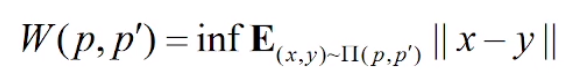

Interpretation of EM-distance. Imagine that 2 distributions are two piles of sand. EM-distance is cost of moving 

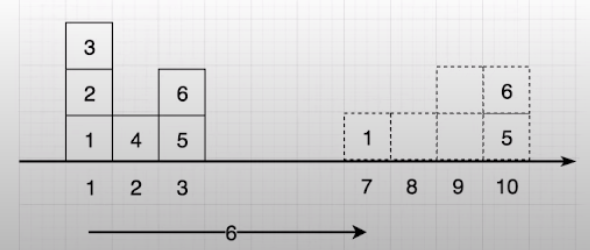

Use NN with clipped outputs as discriminator (in WGANs it's called critic) that must be maxxed. Critic doesn't have sigmoid and it's task is regression task - it finds distance between distributions.

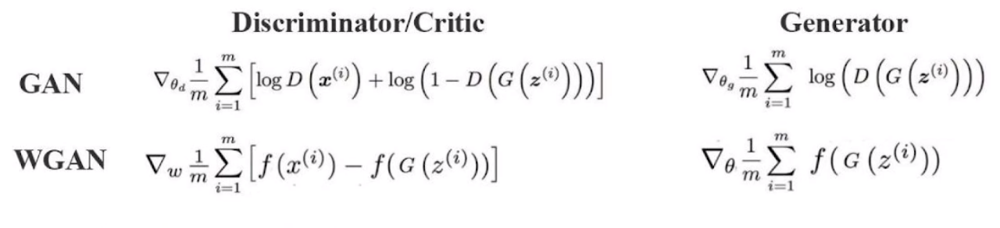

# WGAN algorithm

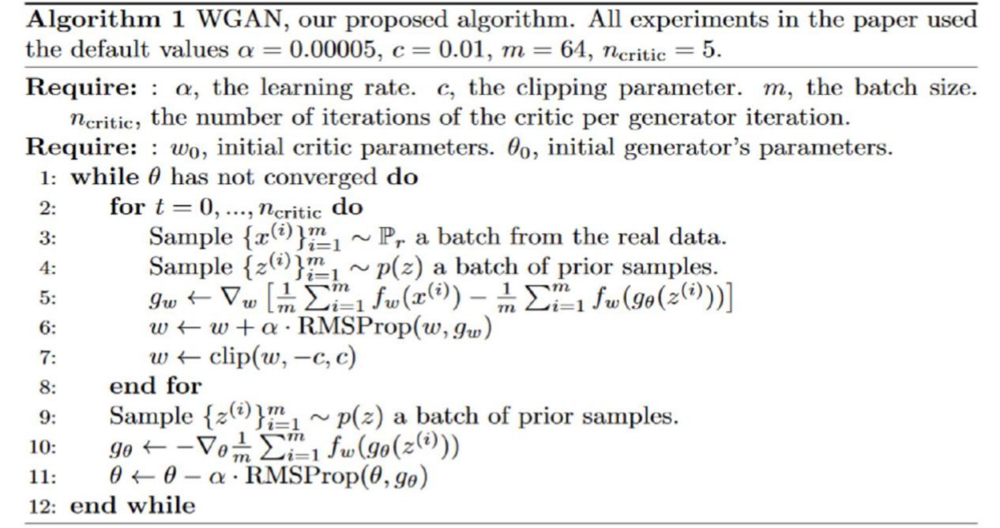

# WGAN vs GAN

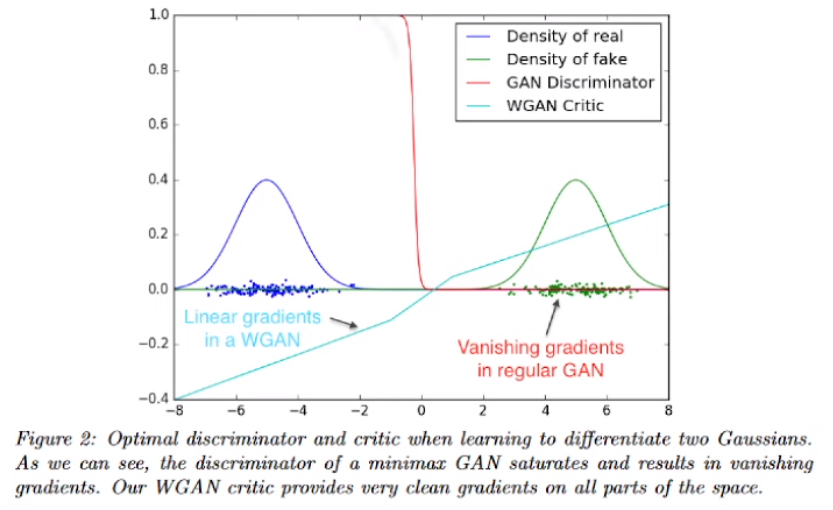

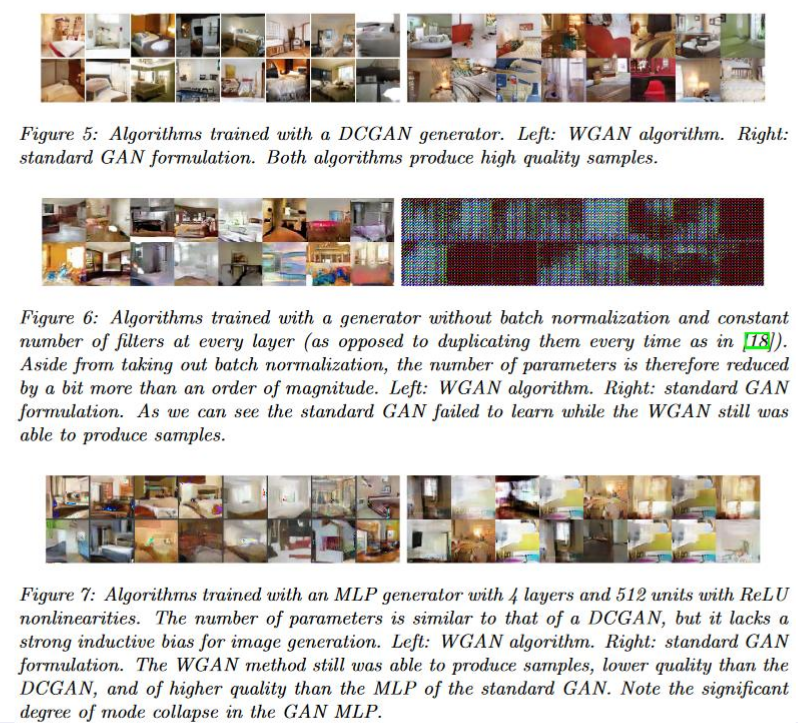

# WGAN with Gradiend Penalty (WGAN-GP)

Main idea: soft penalty for gradients instead of gradient clipping

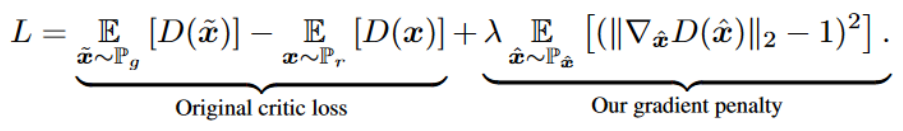

- this penalty requires gradient to be close to 1
- no critic BN
- robust to architechture selection
- was used in many SOTA models (Prog GAN, Style GAN, etc.)

## WGAN algorithm

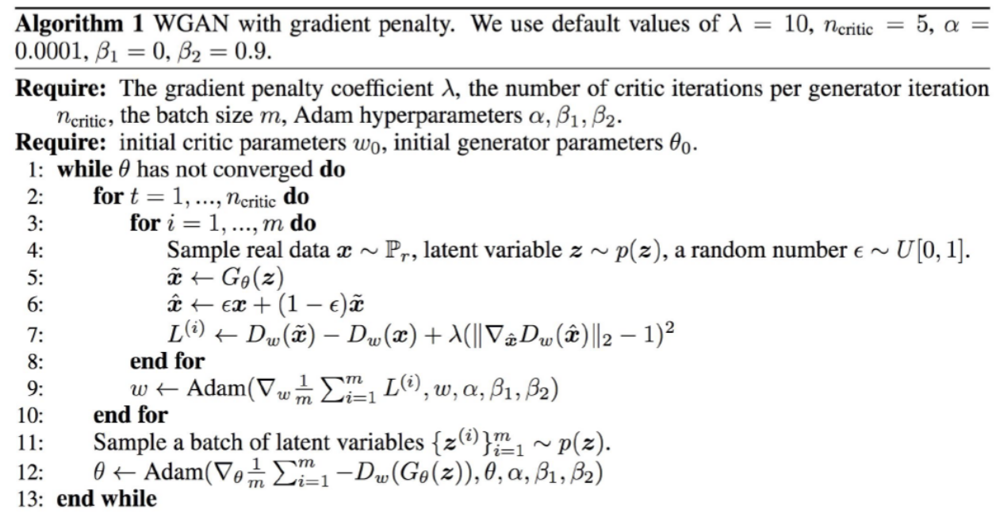

## WGAN vs 

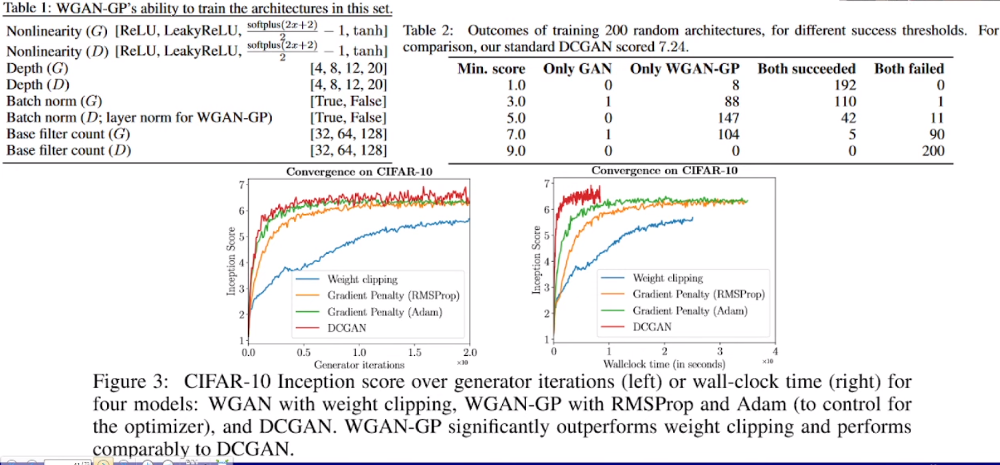

# f-GAN

Main idea: use f-divergence

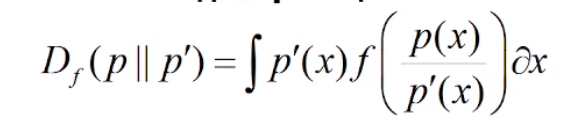

There is a fact that

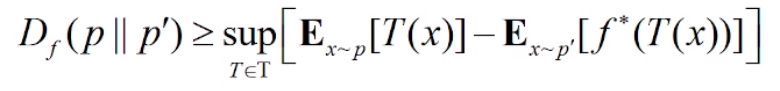

Where T - arbitrary function, and f* Fenchel conjugate function. So we can decrease divergence by decreasing right part of this math inequality.

### Base functions correspond to different divergences

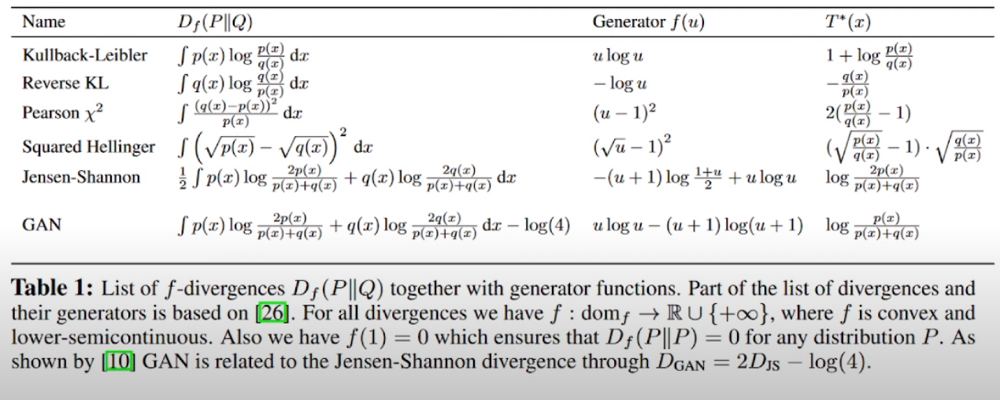

# GAN problems: Mode-Collapse

GAN selects one/few generation examples that are passed by discriminator and generates only them.

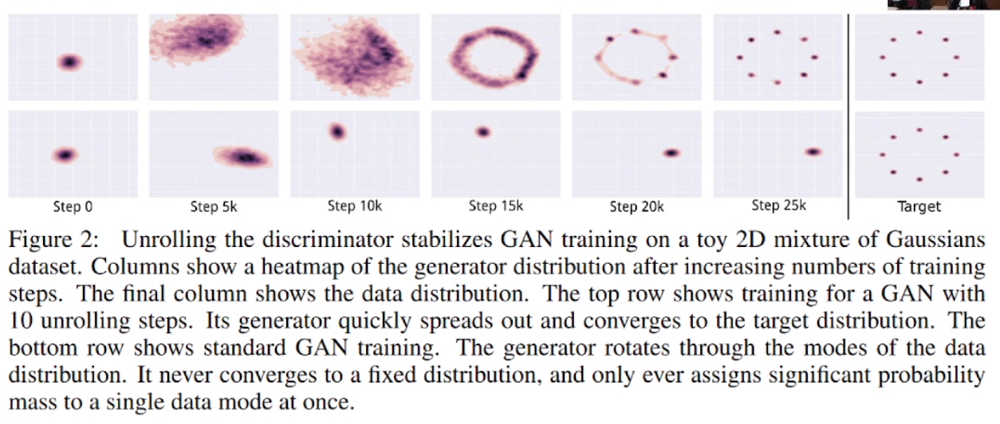

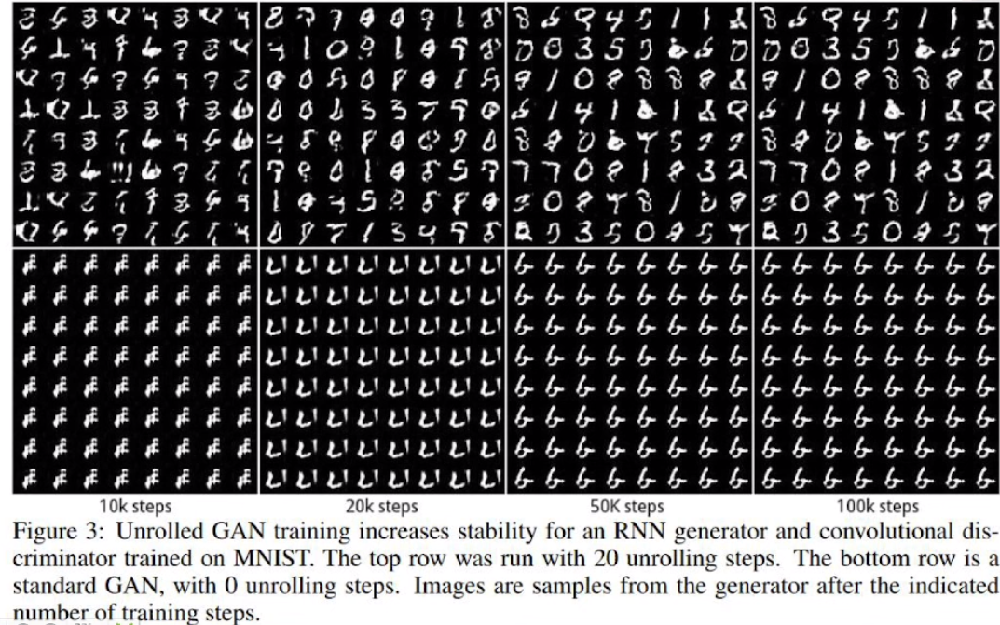

# How to solve?

1. Specific batch orgranization (all fake or all real)

2. Unrolled GAN

Main idea: change discriminator during training, so generator considers answers from multiple different discriminators.

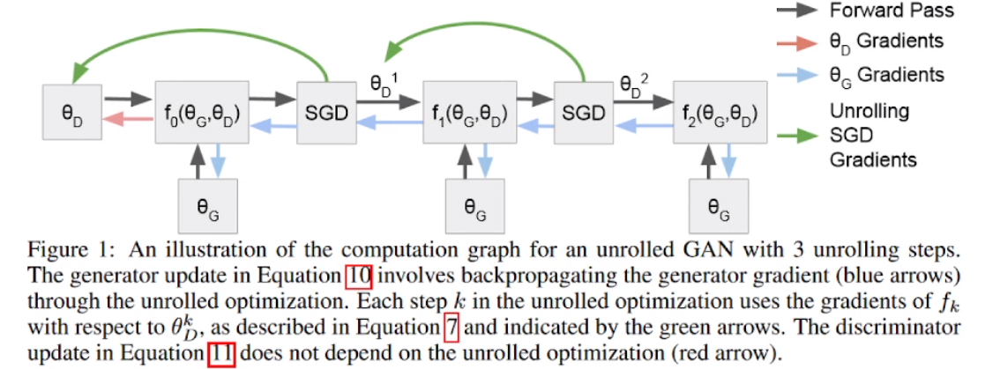

3. Mixture GAN

Main idea: multiple GANs generates different images, then they are mixed and sent to discriminator.

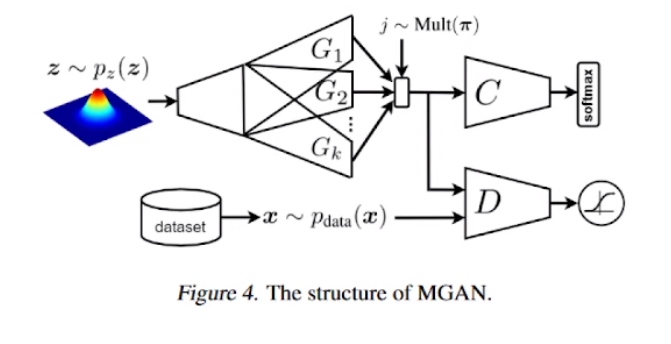

4. Energy-Based GAN (EBGAN)

Main idea: discriminator is AutoEncoder that learns the real data. If AE restores image from generator good - image is real, else - fake.

# How to evaluate quality of generated images?

Generated images -> SOTA-classificator
 - classificator must be confident about generated image (if cat image is generated - classificator must be confident that this is image of a cat)
 - generator images must be different
 
 
 
Another way is 1-NN classifier: take two samples of real images and fakes that have the same sizes and use Leave-One-Out Scheme + 1-NN classifer to find nearest neighbour for each image. If 1-NN classifier is failed to find where  is real and where is fake - that's good.